In [1]:
import pandas as pd
from pathlib import Path
import inspect 
import numpy as np
import datetime
import os
import json
import matplotlib.pyplot as plt
from torch.utils.tensorboard import SummaryWriter
from dotmap import DotMap
import torch
import torch.nn.init as init
import torch.nn as nn
import pickle
import torch.autograd as autograd
from torchviz import make_dot
from torchsummary import summary
from termcolor import colored
import seaborn as sns
sns.set_theme(style="white", rc={"axes.grid": False})


from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.metrics.pairwise import rbf_kernel
from scipy.stats import wasserstein_distance, entropy
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

In [2]:
reserved = int(torch.cuda.max_memory_reserved() / 1000 / 1000)
gpu_available = torch.cuda.is_available()

print(colored(f"GPU available! {torch.cuda.get_device_name()}. Memory reserved: {reserved}MB", "green") if gpu_available else colored("No GPU. Running on CPU", "red"))

GPU available! NVIDIA GeForce RTX 3060. Memory reserved: 0MB


In [3]:
# For Macbook M3
device = "cuda"  # device

## PICK UP WHERE LEFT OFF

**Current Status**
1. Made progress on getting appreciable accuracy on FCNN_night notebook for E0 and rb. MixMaxScaler is the way to go. Since we have no negative value for E0 and rb. Used sigmoid on last layer too.
2. Move that architecture here into Learning Block and see how it performs.
3. Can also try and add a physics based loss on dNEE as regularizer

In [4]:
timestamp = datetime.datetime.now()
timestamp = f"{timestamp.year}-{timestamp.month}-{timestamp.day}_{timestamp.hour}-{timestamp.minute}-{timestamp.second}-{timestamp.microsecond}"

save_dir = Path(timestamp)
if save_dir.exists():
    raise f"Directory exists: {save_dir.as_posix()}"
os.makedirs(save_dir.as_posix())

In [5]:
config = DotMap({"flux_model": "night"})

In [6]:
writer = SummaryWriter(save_dir.joinpath("tensorboard"))

## Model Building and Training

### Data

In [7]:
data = pd.read_parquet("../../PIVAE/PI-VAE-Climate/data_manipulation/final_night_data.parquet")

In [8]:
def set_season_tag(df, isnorth = True):
    if isnorth:
        df["season"] = (df['DateTime'].dt.month%12 + 3) // 3 # print(seasons)
    else:
        df["season"] = ((df['DateTime'].dt.month + 6)%12 + 3)//3
    return df, "season"

def extract_time_features(df):
    """
    Extract features from the timestamp for model training.
    
    Parameters:
    data (pd.DataFrame): DataFrame with 'Timestamp' and 'NEE' columns.
    
    Returns:
    pd.DataFrame: DataFrame with extracted features, list: features added to dataframe
    """
    df = df.copy()
    df['hour'] = df['DateTime'].dt.hour
    df['dayofweek'] = df['DateTime'].dt.dayofweek
    df['month'] = df['DateTime'].dt.month
    df['dayofyear'] = df['DateTime'].dt.dayofyear
    return df, ["hour", "dayofweek", "month", "dayofyear"]

def split_data_years(df, train_years, test_years, test_size=0.2):
    """
    Split data into training and test sets.
    
    Parameters:
    data (pd.DataFrame): DataFrame with 'Timestamp' and 'NEE' columns.
    train_years (int): Years to include in training data
    test_years (int): Years to include in test data
    
    Returns:
    tuple: Training and test DataFrames.
    """
    
    train_data = df[df.apply(lambda x: x['DateTime'].year in train_years, axis=1)]
    test_data = df[df.apply(lambda x: x['DateTime'].year in test_years, axis=1)]
    return train_data.reset_index(drop=True), test_data.reset_index(drop=True)
    
def split_data(df, test_size=0.2):
    """
    Split data into training and test sets.
    
    Parameters:
    data (pd.DataFrame): DataFrame with 'Timestamp' and 'NEE' columns.
    test_size (float): Proportion of the data to include in the test split.
    
    Returns:
    tuple: Training and test DataFrames.
    """
    train_data, test_data = train_test_split(df, test_size=test_size, shuffle=False)
    return train_data.reset_index(drop=True), test_data.reset_index(drop=True)

def physics_nee(k, T, Tref=10, T0=46.02):
    e0 = k[:, 0]
    rb = k[:, 1]
    exp_term = np.exp(e0 * (1.0 / (Tref - T0) - 1.0 / (T - T0)))
    NEE = rb * exp_term
    return NEE

In [9]:
data['year'] = data.DateTime.dt.year

In [10]:
data["NEE_phy"] = physics_nee(data[["E0", "rb"]].values, data.Ta.values)

In [11]:
drivers = np.array(['Ta', 'H', 'Tau', 'LE_strg', 'RH', 'VPD', 'Rg', 'Ustar', 'Tsoil1', 'Tsoil2'])

In [12]:
data, season_feat = set_season_tag(data)
data, time_feat = extract_time_features(data)

In [13]:
data = data[data["dNEE"].notna()].reset_index(drop=True)

In [14]:
drivers = np.concatenate([drivers, [season_feat], time_feat])

In [15]:
columns_to_check_na = np.concatenate([drivers, ["NEE", "dTa"]])

idx = (np.sum(data[columns_to_check_na].notna(), axis=1) == columns_to_check_na.shape[0])
data = data.loc[idx].reset_index(drop=True)

### Training Data 

In [16]:
train_data, test_data = split_data(data)
# train_data, test_data = split_data_years(data, [2012, 2016, 2018], [2015, 2017])

In [17]:
#drivers = np.append(drivers, ["NEE"])
X_train = train_data[drivers]
X_train = train_data[drivers]
NEE_train = train_data["NEE_next"]
T_train = train_data["Ta"]
dT_train = train_data["dTa"]
dNEE_train = train_data["dNEE"]
bNEE_train = train_data["NEE"]
K_train = train_data[["E0", "rb"]]

X_test = test_data[drivers]
NEE_test = test_data["NEE_next"]
T_test = test_data["Ta"]
dT_test = test_data["dTa"]
dNEE_test = test_data["dNEE"]
bNEE_test = test_data["NEE"]
K_test = test_data[["E0", "rb"]]


In [18]:
normalizer_x = StandardScaler()

X_train = normalizer_x.fit_transform(X_train)
X_test = normalizer_x.transform(X_test)


In [19]:
config.data.X = drivers.tolist()
config.data.train_size = X_train.shape[0]
config.data.train_start_date = train_data["DateTime"].iloc[0].ctime()
config.data.train_end_date = train_data["DateTime"].iloc[-1].ctime()
config.data.test_size = X_test.shape[0]
config.data.test_start_date = test_data["DateTime"].iloc[0].ctime()
config.data.test_end_date = test_data["DateTime"].iloc[-1].ctime()

config.data.train_years = np.unique(train_data.DateTime.dt.year).tolist()
config.data.test_years = np.unique(train_data.DateTime.dt.year).tolist()

### Model Building

In [30]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class FCNN(nn.Module):
    def __init__(self, input_dim, latent_dim, encoder_dims, residual_dims, decoder_dims, noise_dims=[4], activation=nn.ReLU, device=device):
        super(FCNN, self).__init__()

        self.input_dim = input_dim
        self.latent_dim = latent_dim
        self.residual_dims = residual_dims
        self.activation = activation
        self.device = device
        self.Tref = torch.tensor(10).float().to(self.device)
        self.T0 = torch.tensor(46.02).float().to(self.device)
        self.encoder_dims = encoder_dims
        self.decoder_dims = decoder_dims

        # Encoder network
        modules = self.append_linear_modules(self.input_dim, self.encoder_dims)
        modules.append(nn.Linear(self.encoder_dims[-1], self.latent_dim))
        print(modules)
        self.encoder = nn.Sequential(*modules)

        # Decoder network for residual
        modules = self.append_linear_modules(self.latent_dim, self.residual_dims)
        modules.append(nn.Linear(self.residual_dims[-1], 1))
        self.residual = nn.Sequential(*modules)
        
        # Decoder network for NEE (u)
        modules = self.append_linear_modules(latent_dim, decoder_dims)
        modules.append(nn.Linear(decoder_dims[-1], 1))
        self.nee_decoder = nn.Sequential(*modules)
    
        # Decoder network for dT/dt (f)
        modules = self.append_linear_modules(self.latent_dim, self.decoder_dims)
        modules.append(nn.Linear(self.decoder_dims[-1], 1))
        self.temp_derivative_decoder = nn.Sequential(*modules)

        # Decoder network for E0 and rb
        modules = self.append_linear_modules(self.latent_dim, self.decoder_dims, nn.LeakyReLU(negative_slope=0.01))
        modules.append(nn.Linear(self.decoder_dims[-1], 2))
        modules.append(nn.LeakyReLU(negative_slope=0.01))
        self.k_decoder = nn.Sequential(*modules)

    def append_linear_modules(self, in_dim, dims, activation=None):
        modules = []
        for i, dim in enumerate(dims):
            modules.append(nn.Linear(in_dim, dim))
            modules.append(self.activation()) if not activation else modules.append(activation)
            in_dim = dim
        return modules
        
    def forward(self, x, b):
        input_ = torch.cat((x, b.view(x.shape[0], 1)), dim=1).to(self.device)
        z = self.encoder(input_)
        nee = self.nee_decoder(z)
        dT_dt = self.temp_derivative_decoder(z)
        k_pred = self.k_decoder(z)
        return nee, dT_dt, k_pred


# PICK UP: 
- ### Fix Physics Model to Predict dNEE
- ### Incorporate denormalizer using z-score in NN
- ### Fix e0, rb separate to now combined K in training loops

In [31]:
class MMD_loss(nn.Module):
    'description'
    # function class which calculates the MMD distance of 2 distributions

    def __init__(self, kernel_mul = 2.0, kernel_num = 5):
        super(MMD_loss, self).__init__()

        self.kernel_num = kernel_num
        self.kernel_mul = kernel_mul
        self.fix_sigma = None
        return
    
    def guassian_kernel(self, source, target, kernel_mul=2.0, kernel_num=5, fix_sigma=None):
        n_samples = int(source.size()[0])+int(target.size()[0])
        total = torch.cat([source, target], dim=0)

        total0 = total.unsqueeze(0).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
        total1 = total.unsqueeze(1).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
        L2_distance = ((total0-total1)**2).sum(2) 
        if fix_sigma:
            bandwidth = fix_sigma
        else:
            bandwidth = torch.sum(L2_distance.data) / (n_samples**2-n_samples)
        bandwidth /= kernel_mul ** (kernel_num // 2)
        bandwidth_list = [bandwidth * (kernel_mul**i) for i in range(kernel_num)]
        kernel_val = [torch.exp(-L2_distance / bandwidth_temp) for bandwidth_temp in bandwidth_list]
        return sum(kernel_val)

    def forward(self, source, target):
        batch_size = int(source.size()[0])
        kernels = self.guassian_kernel(source, target, kernel_mul=self.kernel_mul, kernel_num=self.kernel_num, fix_sigma=self.fix_sigma)
        XX = kernels[:batch_size, :batch_size]
        YY = kernels[batch_size:, batch_size:]
        XY = kernels[:batch_size, batch_size:]
        YX = kernels[batch_size:, :batch_size]
        loss = torch.mean(XX + YY - XY -YX)
        return loss

In [32]:
def loss_function_k(y_pred, y_true, loss_fn):
    # MMD Loss for NEE (u)
    if isinstance(y_pred, list):
        loss = []
        for i in range(len(y_pred)):
            loss.append(loss_fn(y_true[i], y_pred[i]))
        return loss
        
    loss = loss_fn(y_true, y_pred) 

    return loss
    
def loss_function(nee_pred, nee_true, temp_pred, temp_true, E0_rb_pred,
                      E0_rb_true, loss_fn):
        # Loss for NEE (u)
        loss_nee = loss_fn(nee_pred, nee_true)

        # Loss for E0 and rb (k)
        E0_pred, rb_pred = E0_rb_pred[:, 0], E0_rb_pred[:, 1]
        E0_true, rb_true = E0_rb_true[:, 0], E0_rb_true[:, 1]

        loss_E0 = loss_fn(E0_pred.view((-1, 1)), E0_true.view((-1, 1)))
        loss_rb = loss_fn(rb_pred.view((-1, 1)), rb_true.view((-1, 1)))

        # loss for temperature derivative (f)
        temp_loss = loss_fn(temp_pred.view((-1, 1)), temp_true.view((-1, 1)))

        # Total loss
        # total_loss = loss_nee + loss_E0 + loss_rb + temp_loss + physics_loss + f_loss
        return loss_nee, loss_E0, loss_rb, temp_loss

In [33]:
class ClimateDataset(Dataset):
    def __init__(self, X, k, T, dNEE, bNEE, dT, NEE):
        """
        Args:
            X (numpy array): Input data of shape (n_samples, input_dim)
            k (numpy array): Ground truth for E0 and rb, shape (n_samples, 2)
            T (numpy array): Ground truth for Tair, shape (n_samples, 1)
            dNEE (numpy array): Ground truth for f, shape (n_samples, 1)
            bNEE (numpy array): Ground truth for NEE at current t (boundary condition), shape (n_samples, 1)
            dT (numpy array): Ground truth for temperature derivative, shape (n_samples, 1)
            NEE (numpy array): Ground truth for NEE at t + 1, shape (n_samples, 1)
        """
        self.X = torch.tensor(X, dtype=torch.float32)
        self.k = torch.tensor(k, dtype=torch.float32)
        self.T = torch.tensor(T, dtype=torch.float32)
        self.dNEE = torch.tensor(dNEE, dtype=torch.float32)
        self.bNEE = torch.tensor(bNEE, dtype=torch.float32)
        self.dT = torch.tensor(dT, dtype=torch.float32)
        self.NEE = torch.tensor(NEE, dtype=torch.float32)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        # Get current NEE and previous NEE for boundary condition
        return {
            'X': self.X[idx],
            'k': self.k[idx],
            'T': self.T[idx],
            'dNEE': self.dNEE[idx],
            'bNEE': self.bNEE[idx],
            'dT': self.dT[idx],
            'NEE': self.NEE[idx]
        }

### Training Setup

In [34]:
activation = nn.ReLU

In [35]:
def initialize_weights(layer):
    if isinstance(layer, nn.Linear):
        # Apply He initialization
        init.xavier_uniform_(layer.weight)
        #init.kaiming_normal_(layer.weight, mode='fan_in', nonlinearity=activation)
        init.zeros_(layer.bias)

In [36]:
lr = 1e-3


model = FCNN(input_dim=X_train.shape[1] + 1, latent_dim=32, encoder_dims=[16, 16], residual_dims=[16, 16, 8], decoder_dims = [16, 16], activation=nn.LeakyReLU)
model.apply(initialize_weights)
with open(save_dir.joinpath("model.txt"), "w") as fp:
    fp.write(str(model))

model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

# Assuming X, k, dNEE, dT, and NEE are numpy arrays you have
train_dataset = ClimateDataset(X_train, K_train.values, T_train.values, dNEE_train.values, bNEE_train.values, dT_train.values, NEE_train.values)
test_dataset = ClimateDataset(X_test, K_test.values, T_test.values, dNEE_test.values, bNEE_test.values, dT_test.values, NEE_test.values)

# Create a DataLoader instance
train_data_loader = DataLoader(train_dataset, batch_size=256, shuffle=False)
test_data_loader = DataLoader(test_dataset, batch_size=256, shuffle=False)

[Linear(in_features=16, out_features=16, bias=True), LeakyReLU(negative_slope=0.01), Linear(in_features=16, out_features=16, bias=True), LeakyReLU(negative_slope=0.01), Linear(in_features=16, out_features=32, bias=True)]


In [37]:
print(model)

FCNN(
  (encoder): Sequential(
    (0): Linear(in_features=16, out_features=16, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=16, out_features=16, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=16, out_features=32, bias=True)
  )
  (residual): Sequential(
    (0): Linear(in_features=32, out_features=16, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=16, out_features=16, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=16, out_features=8, bias=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Linear(in_features=8, out_features=1, bias=True)
  )
  (nee_decoder): Sequential(
    (0): Linear(in_features=32, out_features=16, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=16, out_features=16, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=16, out_features=1, bias=True)
  )
  (temp_derivative_decoder

In [38]:
model_parameters = filter(lambda p: p.requires_grad, model.parameters())
params = sum([np.prod(p.size()) for p in model_parameters])
print(params)
config.model.params = int(params)

4501


In [39]:
loss_fn = nn.MSELoss()  # MMD_loss()  # nn.MSELoss()

config.model.activation = str(model.activation)
config.model.lr = lr
config.model.loss_fn = str(loss_fn)

with open(save_dir.joinpath("loss_function.txt"), "w") as fp:
    fp.write(inspect.getsource(loss_function))

In [40]:
for batch in train_data_loader:
    x = batch['X'].to(device)
    k = batch['k'].to(device)
    f = batch['dNEE'].to(device).view(-1, 1)
    b = batch['bNEE'].to(device).view(-1, 1)
    T = batch['T'].to(device).view(-1, 1)
    dtemp = batch['dT'].to(device).view(-1, 1)
    nee = batch['NEE'].to(device).view(-1, 1)
    yhat = model(x, b)
    print(len(yhat))
    break


3


In [41]:
num_epochs = 1000

patience = 150
scheduler = ReduceLROnPlateau(optimizer, 'min', patience=patience)

config.training.patience = patience
config.training.num_epochs = num_epochs

In [42]:
with open(save_dir.joinpath("config.json"), "w") as fp:
    json.dump(config.toDict(), fp)

In [43]:
epoch = 0

### Training Phase

In [44]:
best_test_loss = float('inf')
best_model_path = save_dir.joinpath('best_model.pth')

In [ ]:
# CONTROL ROOM
loss_fn = nn.MSELoss() # nn.MSELoss() # MMD_loss()
for g in optimizer.param_groups:
    g['lr'] = 0.0001
    print(g['lr'])


In [54]:
loss_name = "MSE" if str(loss_fn) == 'MSELoss()' else "MMD"

while epoch < num_epochs:

    print(colored("Epoch: {}".format(epoch), "red"))
    train_loss = []
    test_loss = []

    train_losses = DotMap(
        {"mse_loss_nee": [], "mse_loss_E0": [],
         "mse_loss_rb": [], "mse_temp_loss": []})
    # Example of iterating over the DataLoader in the training loop

    for batch in train_data_loader:
        x = batch['X'].to(device)
        k = batch['k'].to(device)
        f = batch['dNEE'].to(device).view(-1, 1)
        b = batch['bNEE'].to(device).view(-1, 1)
        T = batch['T'].to(device).view(-1, 1)
        dtemp = batch['dT'].to(device).view(-1, 1)
        nee = batch['NEE'].to(device).view(-1, 1)

        nee_pred, dT_dt_pred, k_pred = model(x, b)
        # Extract E0 and rb predictions
        E0_pred, rb_pred = k_pred[:, 0], k_pred[:, 1]


        mse_loss_nee, mse_loss_E0, mse_loss_rb, mse_loss_temp = loss_function(
            nee_pred, nee, dT_dt_pred, dtemp, k_pred, k, loss_fn)

        mse_loss = mse_loss_nee + mse_loss_E0 + mse_loss_rb + mse_loss_temp

        loss = mse_loss

        train_losses.mse_loss_nee.append(mse_loss_nee)
        train_losses.mse_loss_E0.append(mse_loss_E0)
        train_losses.mse_loss_rb.append(mse_loss_rb)
        train_losses.mse_temp_loss.append(mse_loss_temp)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss.append(loss.cpu().detach().numpy())

    print(colored("Training Loss: {}".format(np.mean(train_loss)), "blue"))

    writer.add_scalar(f"Train Loss", np.mean(train_loss), epoch)

    for col in train_losses.keys():
        l = [x.cpu().detach().numpy() for x in train_losses[col]]
        print(col, np.mean(l), end=" ")
        writer.add_scalar(f"Train Loss [{col}]", np.mean(l), epoch)
    print("\n")

    test_losses = DotMap(
        {"mse_loss_nee": [], "mse_loss_E0": [],
         "mse_loss_rb": [], "mse_temp_loss": []})

    for batch in test_data_loader:
        x = batch['X'].to(device)
        k = batch['k'].to(device)
        f = batch['dNEE'].to(device).view(-1, 1)
        b = batch['bNEE'].to(device).view(-1, 1)
        T = batch['T'].to(device).view(-1, 1)
        dtemp = batch['dT'].to(device).view(-1, 1)
        nee = batch['NEE'].to(device).view(-1, 1)

        nee_pred, dT_dt_pred, k_pred = model(x, b)
        # Extract E0 and rb predictions
        E0_pred, rb_pred = k_pred[:, 0], k_pred[:, 1]


        mse_loss_nee, mse_loss_E0, mse_loss_rb, mse_loss_temp = loss_function(
            nee_pred, nee, dT_dt_pred, dtemp, k_pred, k, loss_fn)

        mse_loss = mse_loss_nee + mse_loss_E0 + mse_loss_rb + mse_loss_temp

        loss = mse_loss

        test_losses.mse_loss_nee.append(mse_loss_nee)
        test_losses.mse_loss_E0.append(mse_loss_E0)
        test_losses.mse_loss_rb.append(mse_loss_rb)
        test_losses.mse_temp_loss.append(mse_loss_temp)

    test_loss.append(loss.cpu().detach().numpy())

    print(colored("Test Loss: {}".format(np.mean(test_loss)), "red"))
    writer.add_scalar(f"Test Loss", np.mean(test_loss), epoch)

    for col in test_losses.keys():
        l = [x.cpu().detach().numpy() for x in test_losses[col]]
        print(col, np.mean(l), end=" ")
        writer.add_scalar(f"Test Loss [{col}]", np.mean(l), epoch)
    print("\n\n")

    # Save best model
    if epoch % 5 == 0 and np.mean(mse_loss_nee.cpu().detach().numpy()) < best_test_loss:
        best_test_loss = np.mean(mse_loss_nee.cpu().detach().numpy())
        torch.save(model.state_dict(), best_model_path)
        print(colored(f'New best model saved at epoch {epoch + 1} with test loss: {best_test_loss:.4f}',
                      "light_grey"))

    scheduler.step(np.mean(test_loss))
    epoch += 1
    # if epoch % 80 == 0:
    #     print("Reducing LR")
    #     optimizer.param_groups[0]['lr'] = 0.0001




Epoch: 263
Training Loss: 1286.529541015625
mse_loss_nee 3.3556106 mse_loss_E0 1280.7203 mse_loss_rb 2.4534025 mse_temp_loss 0.00011808661 

Test Loss: 197.36782836914062
mse_loss_nee 2.958841 mse_loss_E0 1067.2373 mse_loss_rb 3.3205266 mse_temp_loss 0.00012948354 


Epoch: 264
Training Loss: 1225.883056640625
mse_loss_nee 3.326584 mse_loss_E0 1220.2393 mse_loss_rb 2.316956 mse_temp_loss 0.00014938938 

Test Loss: 233.3692626953125
mse_loss_nee 2.9535174 mse_loss_E0 1141.2278 mse_loss_rb 3.1933234 mse_temp_loss 0.00015453102 


Epoch: 265
Training Loss: 1217.4156494140625
mse_loss_nee 3.3212686 mse_loss_E0 1211.8506 mse_loss_rb 2.2436063 mse_temp_loss 0.00012515057 

Test Loss: 240.73919677734375
mse_loss_nee 2.9477897 mse_loss_E0 1154.4069 mse_loss_rb 3.1608224 mse_temp_loss 0.000117885975 


New best model saved at epoch 266 with test loss: 0.9220
Epoch: 266
Training Loss: 1214.6351318359375
mse_loss_nee 3.3181221 mse_loss_E0 1209.1019 mse_loss_rb 2.2151065 mse_temp_loss 0.0001121319

KeyboardInterrupt: 

In [55]:
model.load_state_dict(torch.load(f"{save_dir}/best_model.pth", weights_only=True)) if save_dir.joinpath("best_model.pth").exists() else None


<All keys matched successfully>

In [56]:
model.eval()

FCNN(
  (encoder): Sequential(
    (0): Linear(in_features=16, out_features=16, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=16, out_features=16, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=16, out_features=32, bias=True)
  )
  (residual): Sequential(
    (0): Linear(in_features=32, out_features=16, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=16, out_features=16, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=16, out_features=8, bias=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Linear(in_features=8, out_features=1, bias=True)
  )
  (nee_decoder): Sequential(
    (0): Linear(in_features=32, out_features=16, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=16, out_features=16, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=16, out_features=1, bias=True)
  )
  (temp_derivative_decoder

## Evaluation and Analysis

In [57]:
def compute_mmd(Y, Y_hat, kernel='rbf', gamma=1.0):
    """
    Compute the Maximum Mean Discrepancy (MMD) between ground truth Y and predictions Y_hat.
    
    Parameters:
    - Y: numpy array, ground truth labels
    - Y_hat: numpy array, predicted labels
    - kernel: string, type of kernel ('rbf', 'linear')
    - gamma: float, kernel coefficient for RBF kernel
    
    Returns:
    - float: MMD value
    """
    Y = Y.reshape(-1, 1)  # Reshape if Y is a 1D array
    Y_hat = Y_hat.reshape(-1, 1)  # Reshape if Y_hat is a 1D array

    if kernel == 'rbf':
        K_yy = rbf_kernel(Y, Y, gamma=gamma)
        K_yhatyhat = rbf_kernel(Y_hat, Y_hat, gamma=gamma)
        K_yyhat = rbf_kernel(Y, Y_hat, gamma=gamma)
    elif kernel == 'linear':
        K_yy = np.dot(Y, Y.T)
        K_yhatyhat = np.dot(Y_hat, Y_hat.T)
        K_yyhat = np.dot(Y, Y_hat.T)
    else:
        raise ValueError("Unsupported kernel")

    mmd = np.mean(K_yy) + np.mean(K_yhatyhat) - 2 * np.mean(K_yyhat)
    return np.sqrt(mmd)

from scipy.stats import entropy

def compute_kl_divergence(Y, Y_hat, bins=100):
    """
    Compute the Kullback-Leibler (KL) Divergence between ground truth Y and predictions Y_hat.
    
    Parameters:
    - Y: numpy array, ground truth labels
    - Y_hat: numpy array, predicted labels
    - bins: int, number of bins for histogram
    
    Returns:
    - float: KL Divergence
    """
    hist_Y, bin_edges = np.histogram(Y, bins=bins, density=True)
    hist_Y_hat, _ = np.histogram(Y_hat, bins=bin_edges, density=True)

    # Adding a small epsilon to avoid log(0)
    epsilon = 1e-10
    hist_Y = hist_Y + epsilon
    hist_Y_hat = hist_Y_hat + epsilon

    # Normalize the histograms
    hist_Y /= np.sum(hist_Y)
    hist_Y_hat /= np.sum(hist_Y_hat)

    return entropy(hist_Y, hist_Y_hat)


In [58]:
test_dataset = ClimateDataset(X_test, K_test.values, T_test.values, dNEE_test.values, bNEE_test.values, dT_test.values, NEE_test.values)
test_data_loader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

In [59]:
preds = DotMap(
    {"nee": [], "bnee": [], "E0": [], "rb": [], "dtemp": []})
gt = DotMap({"nee": [], "E0": [], "rb": [], "dtemp": []})

for batch in test_data_loader:
    x = batch['X'].to(device)
    k = batch['k'].to(device)
    f = batch['dNEE'].to(device)
    b = batch['bNEE'].to(device)
    T = batch['T'].to(device)
    dtemp = batch['dT'].to(device)
    nee = batch['NEE'].to(device)

    nee_pred, dT_dt_pred, k_pred = model(x, b)

    E0_pred, rb_pred = k_pred[:, 0], k_pred[:, 1]

    preds.nee.extend(nee_pred.cpu().detach().numpy().tolist())
    preds.E0.extend(E0_pred.cpu().detach().numpy().tolist())
    preds.rb.extend(rb_pred.cpu().detach().numpy().tolist())
    preds.dtemp.extend(dT_dt_pred.cpu().detach().numpy().flatten().tolist())

    gt.nee.extend(nee.cpu().detach().numpy().tolist())
    gt.E0.extend(k[:, 0].cpu().detach().numpy().tolist())
    gt.rb.extend(k[:, 1].cpu().detach().numpy().tolist())
    gt.dtemp.extend(dtemp.cpu().detach().numpy().tolist())

for col in preds:
    preds[col] = np.array(preds[col])
    if len(preds[col].shape) > 1 and preds[col].shape[1] == 1:
        preds[col] = preds[col].flatten()
for col in gt:
    gt[col] = np.array(gt[col])
    if len(gt[col].shape) > 1 and gt[col].shape[1] == 1:
        gt[col] = gt[col].flatten()


In [60]:
print(colored("Metrics ", "red"))
for col in gt:
    mmd = compute_mmd(gt[col], preds[col])
    wasstn = wasserstein_distance(gt[col], preds[col])
    kl = compute_kl_divergence(gt[col], preds[col])
    mae = mean_absolute_error(gt[col], preds[col])
    r2 = r2_score(gt[col], preds[col])
    print(colored(col, "blue"), "\nMMD: {}, Wasstn: {}, KL: {}, MAE: {}, R2: {}".format(mmd, wasstn, kl, mae, r2))
    config.eval.mae[col] = mae
    config.eval.r2[col] = r2
    config.eval.kl[col] = kl
    config.eval.wasstn[col] = wasstn
    config.eval.mmd[col] = mmd

with open(save_dir.joinpath("config.json"), "w") as fp:
    json.dump(config.toDict(), fp)

Metrics 
nee 
MMD: 0.10641533709792694, Wasstn: 0.43909715663777016, KL: 0.1878276925043296, MAE: 1.145985814377694, R2: 0.677318504486287
E0 
MMD: 0.19681047456687212, Wasstn: 21.626231500797015, KL: 4.405188669363298, MAE: 30.41378432341333, R2: -0.40453702708321515
rb 
MMD: 0.3084721649734215, Wasstn: 0.9270299880500049, KL: 3.4823937670860388, MAE: 1.2508373254799705, R2: 0.5176280676185412
dtemp 
MMD: 0.0018016987362911205, Wasstn: 0.004621925870393226, KL: 1.883042081732132, MAE: 0.00787250233232767, R2: 0.039018964762808195


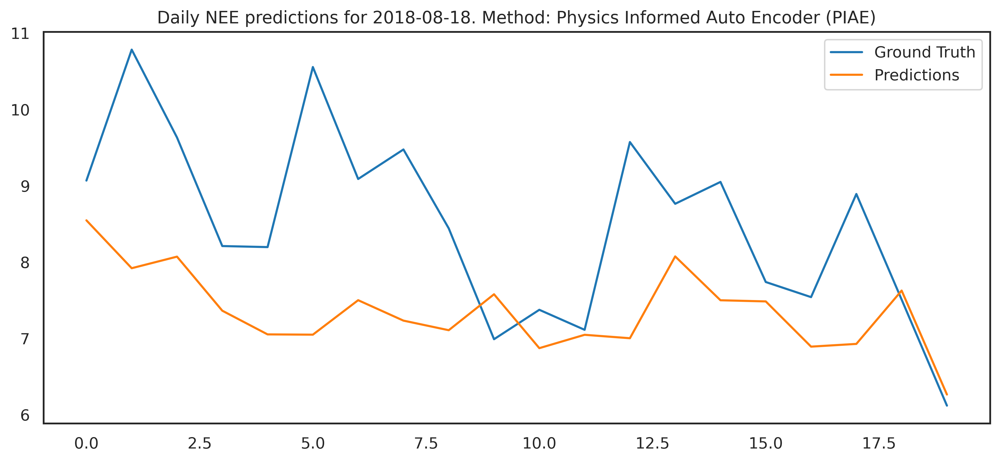

In [66]:
### Daily

test_data['time_diff'] = test_data.DateTime.diff()

test_data['daily_group'] = (test_data.time_diff > pd.Timedelta(hours=2)).cumsum()

mask = (test_data['daily_group'] == 4).values

date = test_data.DateTime[mask].iloc[0]
date = str(date).split(' ')[0]


gt_vis = gt.nee[mask]
preds_vis = preds.nee[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Daily NEE predictions for {date}. Method: Physics Informed Auto Encoder (PIAE)")
fig.savefig("fcnn_nee_night_daily.png", bbox_inches='tight')


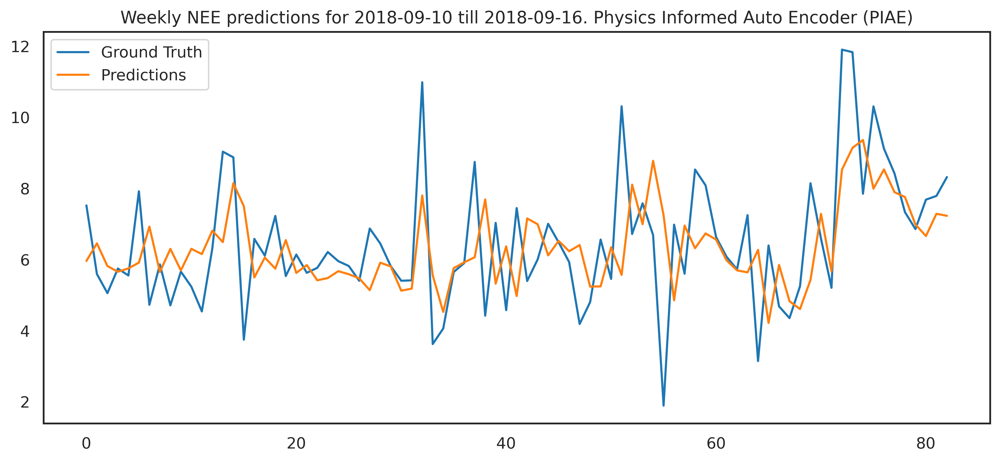

In [67]:
### Weekly

test_data['week_group'] = (test_data['dayofweek'] < test_data['dayofweek'].shift()).cumsum()

mask = test_data.week_group == 4

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt.nee[mask]
preds_vis = preds.nee[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Weekly NEE predictions for {date}. Physics Informed Auto Encoder (PIAE)")
fig.savefig("fcnn_nee_night_weekly.png", bbox_inches='tight')


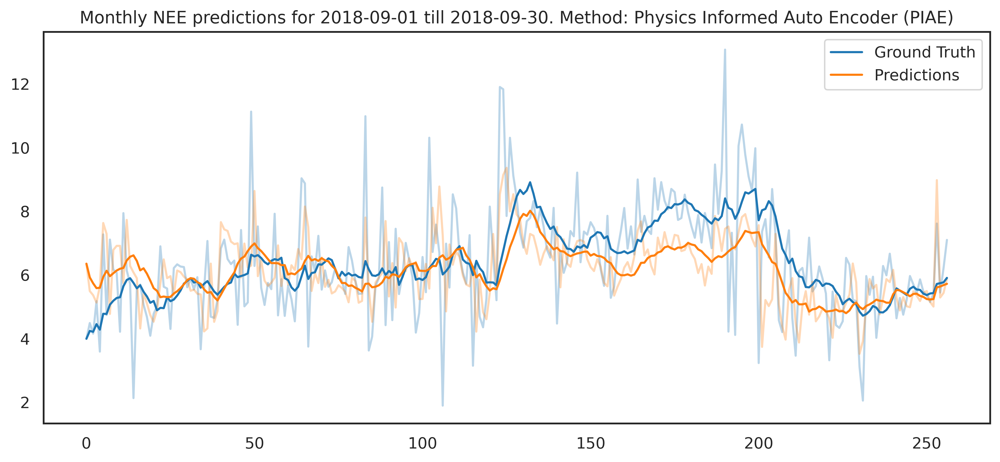

In [68]:
### Monthly

mask = (test_data.DateTime.dt.year == 2018) & (test_data.DateTime.dt.month == 9)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt.nee[mask]
preds_vis = preds.nee[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Monthly NEE predictions for {date}. Method: Physics Informed Auto Encoder (PIAE)")
fig.savefig("fcnn_nee_night_monthly.png", bbox_inches='tight')

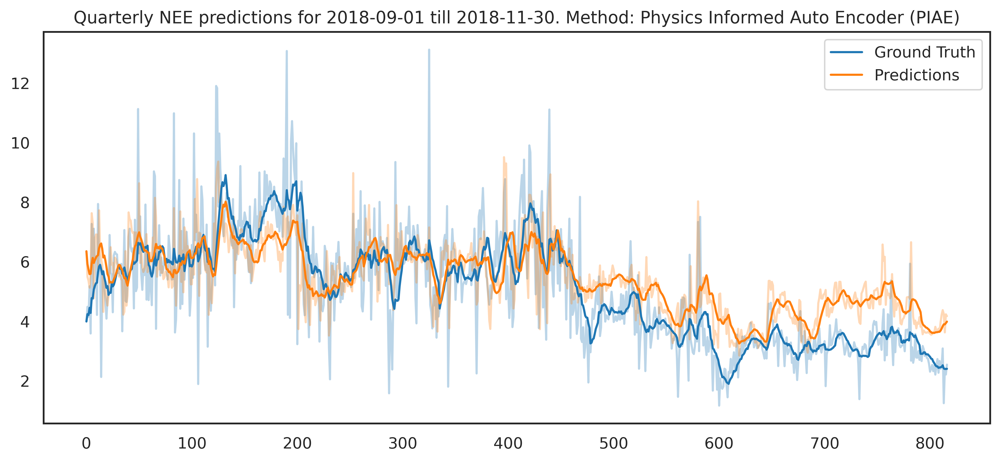

In [69]:
### Quarterly

test_data.season.unique()

mask = (test_data.DateTime.dt.year == 2018) & (test_data.season == 4)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt.nee[mask]
preds_vis = preds.nee[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Quarterly NEE predictions for {date}. Method: Physics Informed Auto Encoder (PIAE)")
fig.savefig("fcnn_nee_night_quarterly.png", bbox_inches='tight')

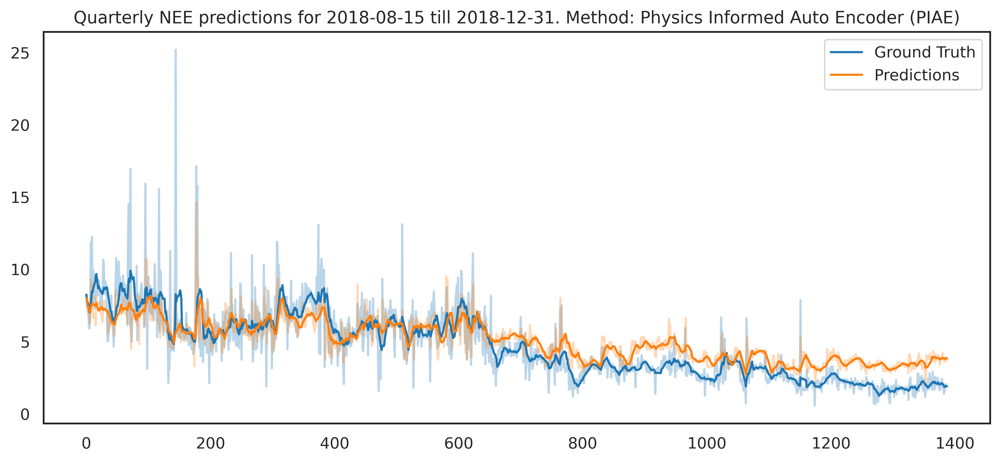

In [70]:
### Quarterly

test_data.season.unique()

mask = (test_data.DateTime.dt.year == 2018)
date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt.nee[mask]
preds_vis = preds.nee[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Quarterly NEE predictions for {date}. Method: Physics Informed Auto Encoder (PIAE)")
fig.savefig("fcnn_nee_night_quarterly.png", bbox_inches='tight')

In [270]:
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

input_rfr = np.concatenate((X_train, bNEE_train.values.reshape((-1, 1))), axis=1)  # list(range(0, 15)) + [16, 17]
rfr = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rfr.fit(input_rfr, NEE_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [271]:
input_rfr = np.concatenate((X_test, bNEE_test.values.reshape((-1, 1))), axis=1)

preds_rfr = rfr.predict(input_rfr)
gt_rfr = NEE_test.values

In [272]:
mmd = compute_mmd(gt_rfr, preds_rfr)
wasstn = wasserstein_distance(gt_rfr, preds_rfr)
kl = compute_kl_divergence(gt_rfr, preds_rfr)
mae = mean_absolute_error(gt_rfr, preds_rfr)
r2 = r2_score(gt_rfr, preds_rfr)
print(colored("NEE", "blue"), "\nMMD: {}, Wasstn: {}, KL: {}, MAE: {}, R2: {}".format(mmd, wasstn, kl, mae, r2))

NEE 
MMD: 0.05583801801576159, Wasstn: 0.17262537026051633, KL: 0.21320336690744857, MAE: 0.892917746627629, R2: 0.7234063644970592


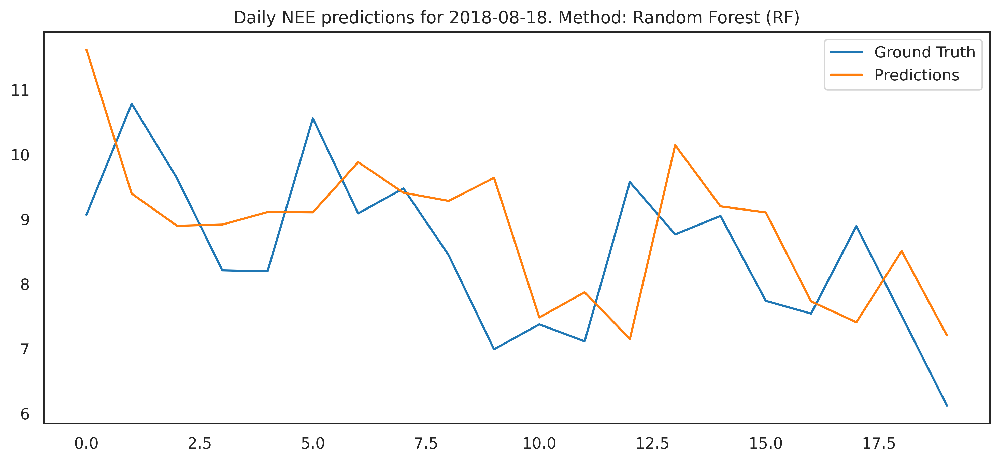

In [273]:
### Daily

test_data['time_diff'] = test_data.DateTime.diff()

test_data['daily_group'] = (test_data.time_diff > pd.Timedelta(hours=2)).cumsum()

mask = (test_data['daily_group'] == 4).values

date = test_data.DateTime[mask].iloc[0]
date = str(date).split(' ')[0]


gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Daily NEE predictions for {date}. Method: Random Forest (RF)")
fig.savefig("RF_nee_night_daily.png", bbox_inches='tight')


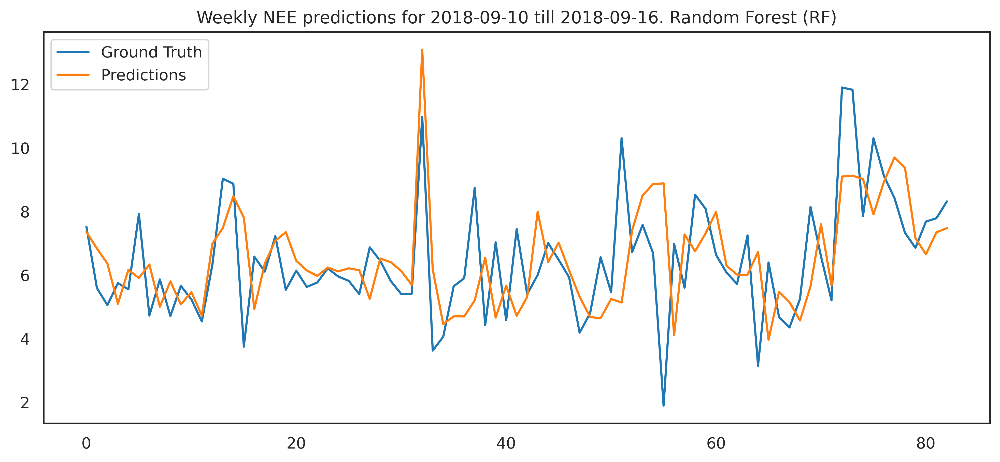

In [274]:
### Weekly

test_data['week_group'] = (test_data['dayofweek'] < test_data['dayofweek'].shift()).cumsum()

mask = test_data.week_group == 4

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Weekly NEE predictions for {date}. Random Forest (RF)")
fig.savefig("RF_nee_night_weekly.png", bbox_inches='tight')


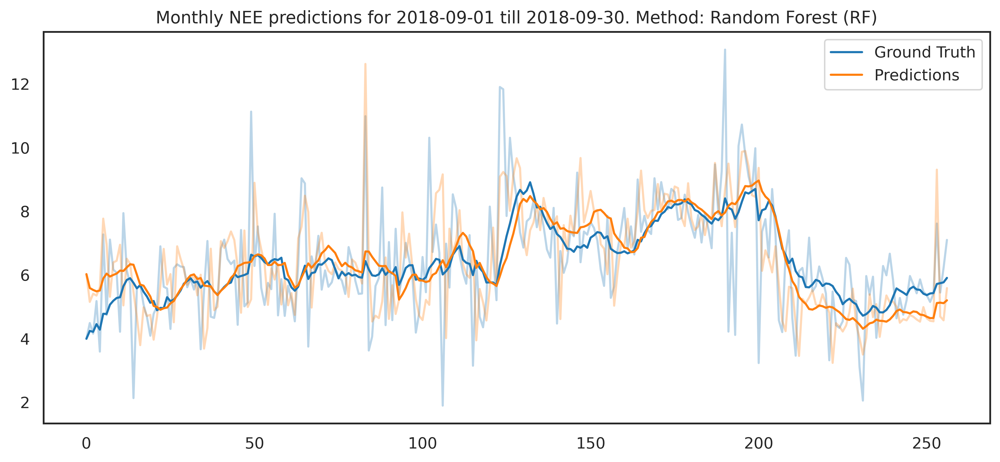

In [177]:
### Monthly

mask = (test_data.DateTime.dt.year == 2018) & (test_data.DateTime.dt.month == 9)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Monthly NEE predictions for {date}. Method: Random Forest (RF)")
fig.savefig("RF_nee_night_monthly.png", bbox_inches='tight')

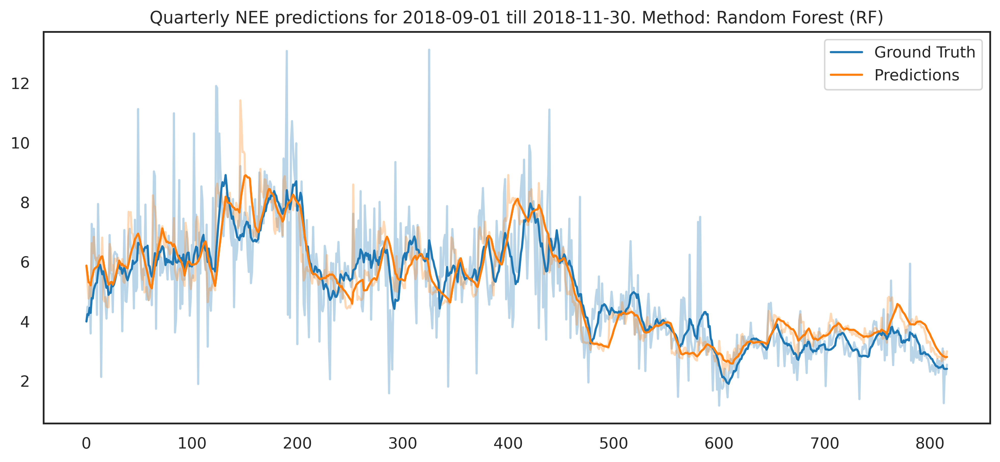

In [130]:
### Quarterly

test_data.season.unique()

mask = (test_data.DateTime.dt.year == 2018) & (test_data.season == 4)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Quarterly NEE predictions for {date}. Method: Random Forest (RF)")
fig.savefig("RF_nee_night_quarterly.png", bbox_inches='tight')

In [131]:

input_rfr = X_train[:, list(range(0, 15)) + [16, 17]]  # list(range(0, 15)) + [16, 17]
rfr = XGBRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rfr.fit(input_rfr, NEE_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=-1,
             num_parallel_tree=None, random_state=42, ...)

In [132]:
input_rfr = X_test[:,list(range(0, 15)) + [16, 17]]

preds_rfr = rfr.predict(input_rfr)
gt_rfr = NEE_test.values

In [133]:
mmd = compute_mmd(gt_rfr, preds_rfr)
wasstn = wasserstein_distance(gt_rfr, preds_rfr)
kl = compute_kl_divergence(gt_rfr, preds_rfr)
mae = mean_absolute_error(gt_rfr, preds_rfr)
r2 = r2_score(gt_rfr, preds_rfr)
print(colored("NEE", "blue"), "\nMMD: {}, Wasstn: {}, KL: {}, MAE: {}, R2: {}".format(mmd, wasstn, kl, mae, r2))

NEE 
MMD: 0.057372811463296335, Wasstn: 0.2589635656289889, KL: 0.2144207206464967, MAE: 1.09421944333918, R2: 0.6401219121036477


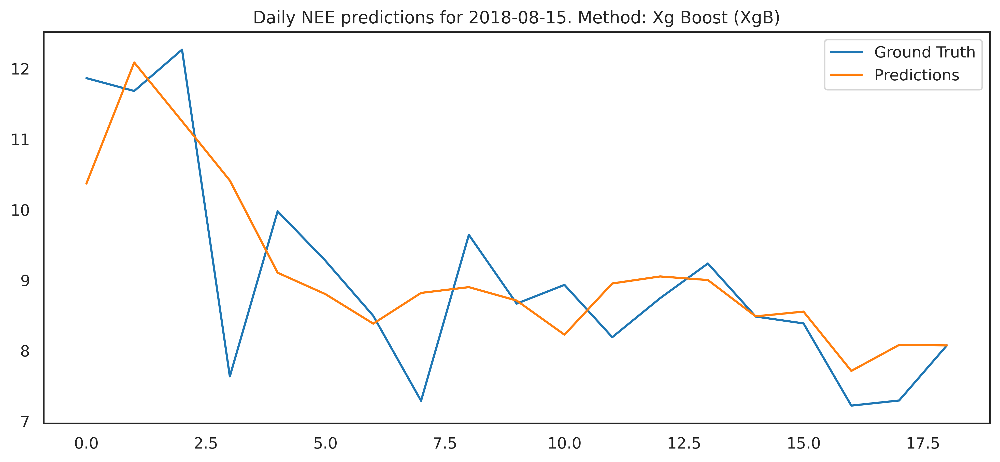

In [134]:
### Daily

test_data['time_diff'] = test_data.DateTime.diff()

test_data['daily_group'] = (test_data.time_diff > pd.Timedelta(hours=2)).cumsum()

mask = (test_data['daily_group'] == 1).values

date = test_data.DateTime[mask].iloc[0]
date = str(date).split(' ')[0]


gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Daily NEE predictions for {date}. Method: Xg Boost (XgB)")
fig.savefig("Xg_nee_night_daily.png", bbox_inches='tight')


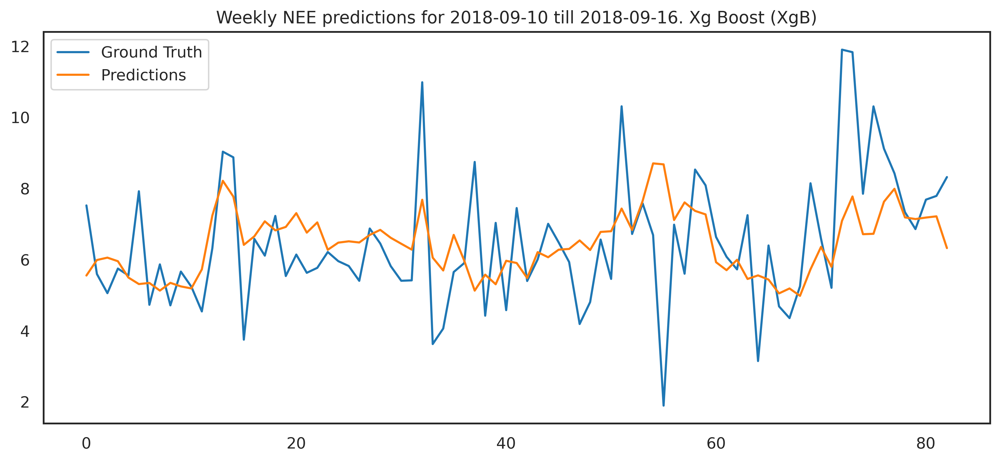

In [135]:
### Weekly

test_data['week_group'] = (test_data['dayofweek'] < test_data['dayofweek'].shift()).cumsum()

mask = test_data.week_group == 4

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, color="#1f77b4")
ax.plot(preds_vis, color="#ff7f0e")
ax.legend(["Ground Truth", "Predictions"])
ax.set_title(f"Weekly NEE predictions for {date}. Xg Boost (XgB)")
fig.savefig("Xg_nee_night_weekly.png", bbox_inches='tight')


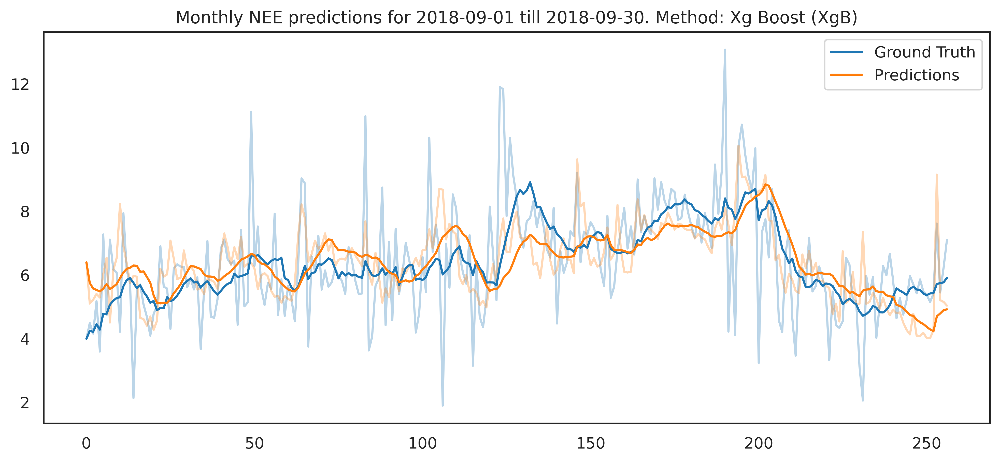

In [136]:
### Monthly

mask = (test_data.DateTime.dt.year == 2018) & (test_data.DateTime.dt.month == 9)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Monthly NEE predictions for {date}. Method: Xg Boost (XgB)")
fig.savefig("Xg_nee_night_monthly.png", bbox_inches='tight')

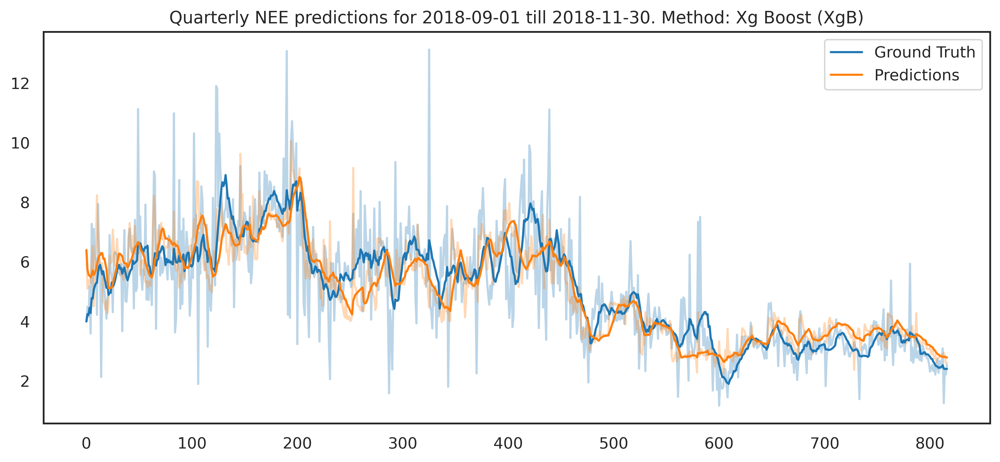

In [137]:
### Quarterly

test_data.season.unique()

mask = (test_data.DateTime.dt.year == 2018) & (test_data.season == 4)

date1 = test_data.DateTime[mask].iloc[0]
date2 = test_data.DateTime[mask].iloc[-1]
date = str(date1).split(' ')[0] + " till " + str(date2).split(' ')[0]

gt_vis = gt_rfr[mask]
preds_vis = preds_rfr[mask].flatten()

window_size = 10
gt_vis_smoothed = pd.Series(gt_vis).rolling(window=window_size, min_periods=1).mean()
preds_vis_smoothed = pd.Series(preds_vis).rolling(window=window_size, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
ax.plot(gt_vis, alpha=0.3, color="#1f77b4")
ax.plot(preds_vis, alpha=0.3, color="#ff7f0e")
ax.plot(gt_vis_smoothed, color="#1f77b4", label="Ground Truth")
ax.plot(preds_vis_smoothed, color="#ff7f0e", label="Predictions")
ax.legend()
ax.set_title(f"Quarterly NEE predictions for {date}. Method: Xg Boost (XgB)")
fig.savefig("Xg_nee_night_quarterly.png", bbox_inches='tight')

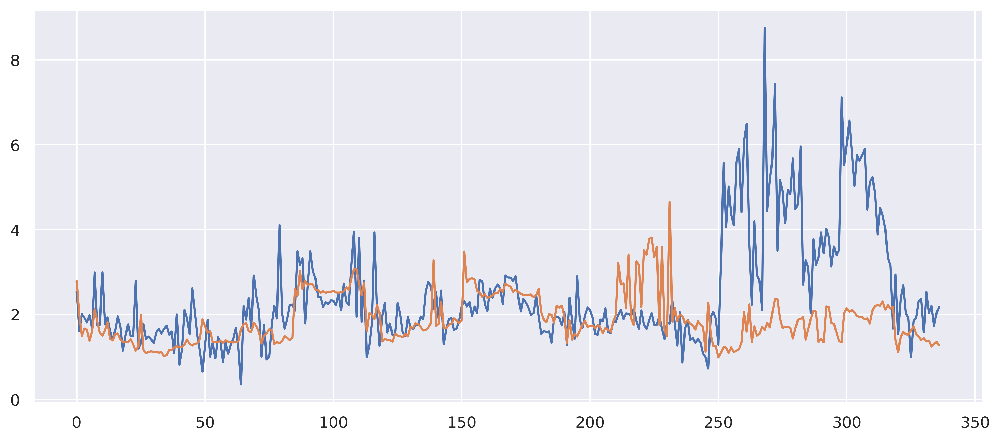

In [106]:
fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
plt.plot(gt_rfr_vis)
plt.plot(preds_rfr_vis)

<BarContainer object of 15 artists>

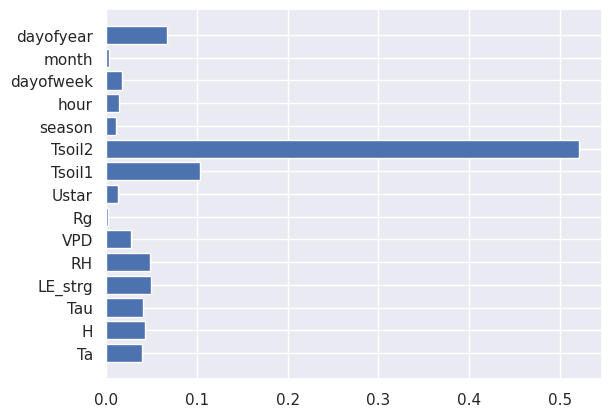

In [107]:
columns = drivers

plt.barh(columns, rfr.feature_importances_)

In [146]:
input_rfr = np.concatenate((X_train, bNEE_train.values.reshape((-1, 1))), axis=1)

In [147]:
rfr = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rfr.fit(input_rfr, NEE_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [148]:
input_rfr = np.concatenate((X_test, bNEE_test.values.reshape((-1, 1))), axis=1)

In [149]:
preds_rfr = rfr.predict(input_rfr)
gt_rfr = NEE_test.values

In [150]:
mean_absolute_error(gt_rfr, preds_rfr), r2_score(gt_rfr, preds_rfr)


(0.892917746627629, 0.7234063644970592)

In [151]:
gt_rfr_vis = gt_rfr[mask]
preds_rfr_vis = preds_rfr[mask]

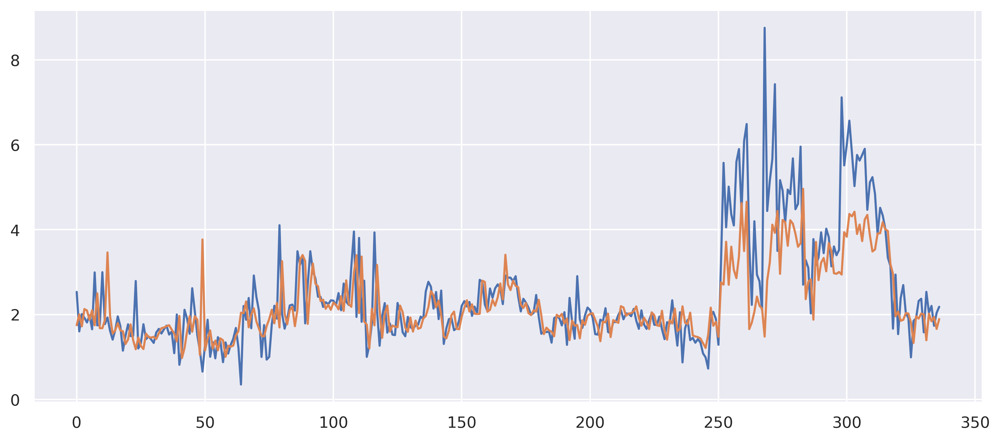

In [152]:
fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
plt.plot(gt_rfr_vis)
plt.plot(preds_rfr_vis)

(0.0, 8.0)

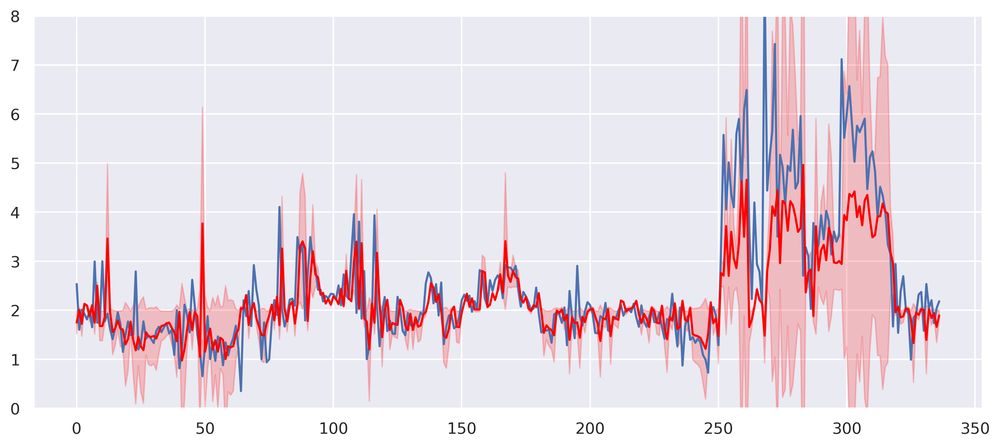

In [154]:
fig, ax = plt.subplots(figsize=(12, 5), dpi=400)
mu = np.mean(preds_rfr_vis)
error = np.square(preds_rfr_vis - mu)
ax.plot(gt_rfr_vis)
ax.plot(preds_rfr_vis, color="red")
ax.fill_between(np.arange(preds_rfr_vis.shape[0]), preds_rfr_vis - error, preds_rfr_vis + error, alpha=0.2, color="red")

ax.set_ylim(0, 8)